<a href="https://colab.research.google.com/github/anilkumarKanasani/tensorflow-deep-learning/blob/main/Notebooks/07_transfer_learning_fine_tunning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Get 10% data

In [ ]:
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_10_percent.zip
!unzip 10_food_classes_10_percent

In [2]:
!ls

10_food_classes_10_percent	__MACOSX
10_food_classes_10_percent.zip	sample_data


In [3]:
! rm ./helper_functions.py
!wget https://raw.githubusercontent.com/anilkumarKanasani/tensorflow-deep-learning/main/helper_functions.py

rm: cannot remove './helper_functions.py': No such file or directory
--2023-06-19 11:25:55--  https://raw.githubusercontent.com/anilkumarKanasani/tensorflow-deep-learning/main/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4045 (4.0K) [text/plain]
Saving to: ‘helper_functions.py’

helper_functions.py 100%[===================>]   3.95K  --.-KB/s    in 0s      

2023-06-19 11:25:55 (61.1 MB/s) - ‘helper_functions.py’ saved [4045/4045]



## Explore Data

### Walk through data

In [4]:
from helper_functions import walk_through_data
raw_data_path = "./10_food_classes_10_percent"
walk_through_data(raw_data_path)

train details : 
Number of classes :  10
Class chicken_curry has :  75 files
Class ice_cream has :  75 files
Class sushi has :  75 files
Class hamburger has :  75 files
Class fried_rice has :  75 files
Class chicken_wings has :  75 files
Class steak has :  75 files
Class grilled_salmon has :  75 files
Class ramen has :  75 files
Class pizza has :  75 files
-----------------------------------
test details : 
Number of classes :  10
Class chicken_curry has :  250 files
Class ice_cream has :  250 files
Class sushi has :  250 files
Class hamburger has :  250 files
Class fried_rice has :  250 files
Class chicken_wings has :  250 files
Class steak has :  250 files
Class grilled_salmon has :  250 files
Class ramen has :  250 files
Class pizza has :  250 files
-----------------------------------


### visulize few raw images

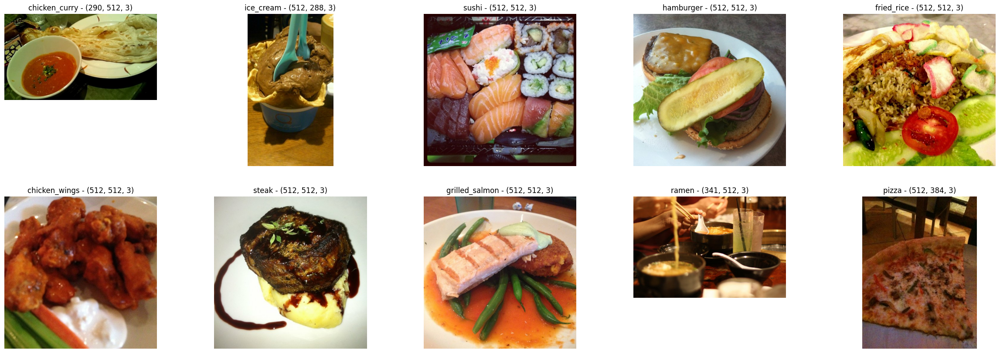

In [5]:
from helper_functions import visulize_multi_class_raw_images
raw_data_path = "./10_food_classes_10_percent"
fold = "train"
visulize_multi_class_raw_images(raw_data_path, fold)

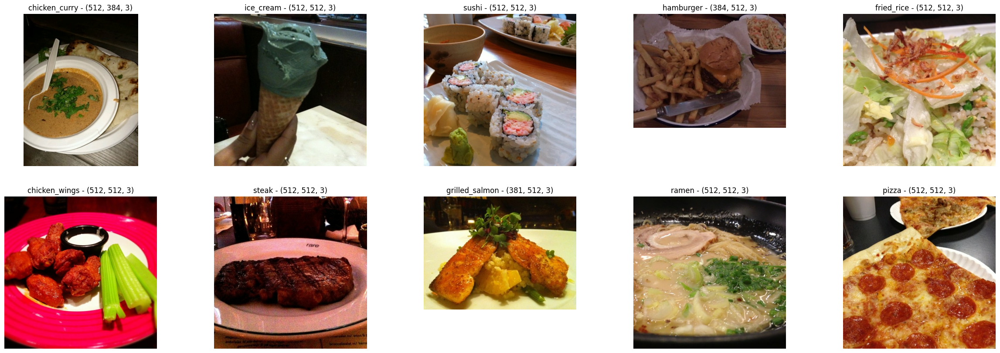

In [6]:
raw_data_path = "./10_food_classes_10_percent"
fold = "test"
visulize_multi_class_raw_images(raw_data_path, fold)

### Get average image sizes

In [7]:
from helper_functions import average_img_shape
raw_data_path = "./10_food_classes_10_percent"
fold = "train"
average_img_shape(raw_data_path, fold)

array([465.85066667, 492.95733333,   3.        ])

In [8]:
raw_data_path = "./10_food_classes_10_percent"
fold = "test"
average_img_shape(raw_data_path, fold)

array([469.164 , 493.5352,   3.    ])

## Prepare Data

In [9]:
train_dir = "./10_food_classes_10_percent/train"
test_dir = "./10_food_classes_10_percent/test"
import tensorflow as tf
tf.random.set_seed(42)
train_data, valid_data = tf.keras.utils.image_dataset_from_directory(
                                                                    directory=train_dir,
                                                                    label_mode='categorical',
                                                                    class_names=None,
                                                                    batch_size=32,
                                                                    image_size=(256, 256),
                                                                    shuffle=True,
                                                                    seed=42,
                                                                    validation_split=0.2,
                                                                    subset="both",
                                                                )

test_data = tf.keras.utils.image_dataset_from_directory(
                                                        directory=test_dir,
                                                        label_mode='categorical',
                                                        class_names=None,
                                                        batch_size=32,
                                                        image_size=(256, 256),
                                                        shuffle=True,
                                                        seed=42,
                                                    )

Found 750 files belonging to 10 classes.
Using 600 files for training.
Using 150 files for validation.
Found 2500 files belonging to 10 classes.


In [10]:
# Number of batches in each dataset
len(train_data), len(valid_data), len(test_data)

(19, 5, 79)

### image augmentation

In [11]:
data_augmentation = tf.keras.Sequential([
                                tf.keras.layers.RandomFlip(mode="horizontal_and_vertical", seed=42),
                                tf.keras.layers.RandomRotation(factor=0.2, seed=42),
                                tf.keras.layers.RandomBrightness(factor=0.2, seed=42),
                                tf.keras.layers.RandomContrast(factor=0.2, seed=42),
                                tf.keras.layers.RandomZoom(height_factor=0.2, width_factor=0.2, seed=42),
                                    ])

resize_and_rescale = tf.keras.Sequential([
                                # tf.keras.layers.Resizing(height=256, width=256),
                                # tf.keras.layers.Rescaling(1./255)
                                    ])

In [12]:
from helper_functions import prepare_dataset
train_data_aug = prepare_dataset(ds=train_data,
                                 data_augmentation = data_augmentation,
                                 resize_and_rescale= resize_and_rescale,
                                 augment=True)

valid_data = prepare_dataset(ds=valid_data,
                                 data_augmentation = data_augmentation,
                                 resize_and_rescale= resize_and_rescale,
                                 augment=False)

test_data = prepare_dataset(ds=test_data,
                                 data_augmentation = data_augmentation,
                                 resize_and_rescale= resize_and_rescale,
                                 augment=False)

In [13]:
train_data_concat = train_data.concatenate(train_data_aug)
train_data_concat.shuffle(buffer_size=32)

<_ShuffleDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 10), dtype=tf.float32, name=None))>

In [14]:
# Number of batches in augmented dataset
len(train_data_aug), len(train_data_concat) , len(train_data), len(valid_data), len(test_data)

(19, 38, 19, 5, 79)

### Visulize images prepared Dataset

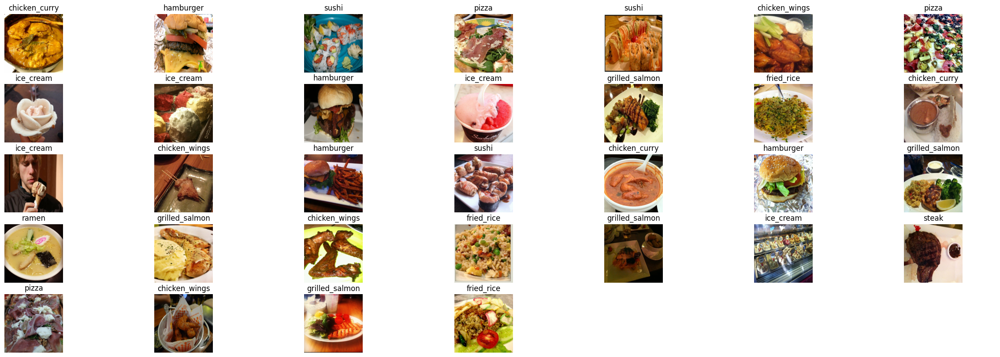

In [15]:
from helper_functions import visulize_batch_from_dataset
classes_list = train_data.class_names
visulize_batch_from_dataset(train_data,classes_list)

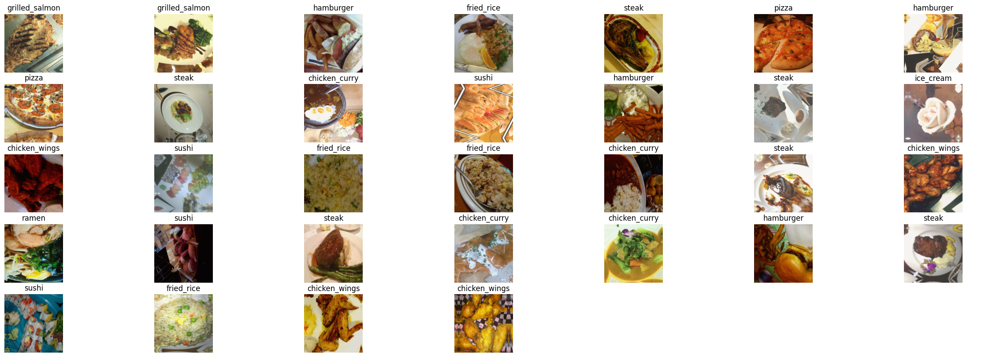

In [16]:
visulize_batch_from_dataset(train_data_aug,classes_list)

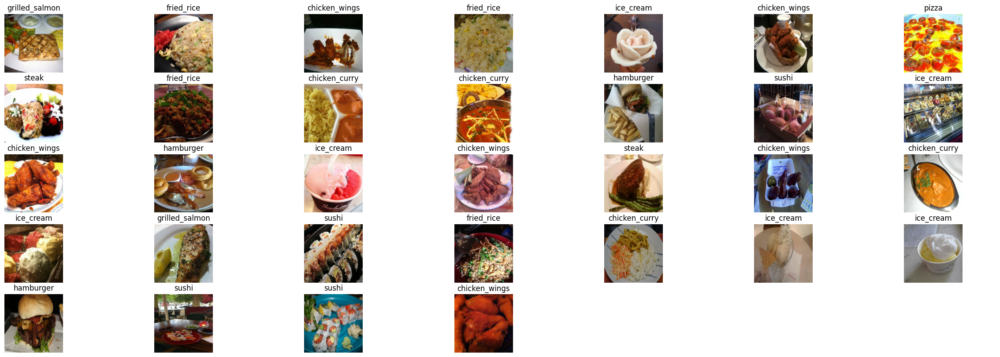

In [27]:
visulize_batch_from_dataset(train_data_concat,classes_list)

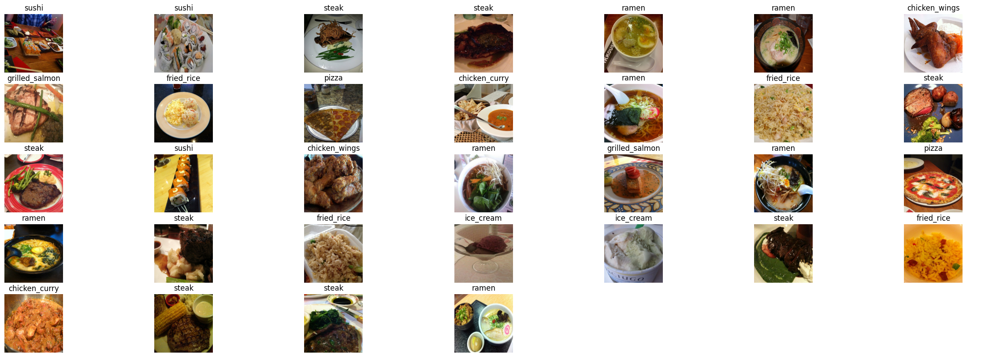

In [18]:
visulize_batch_from_dataset(valid_data,classes_list)

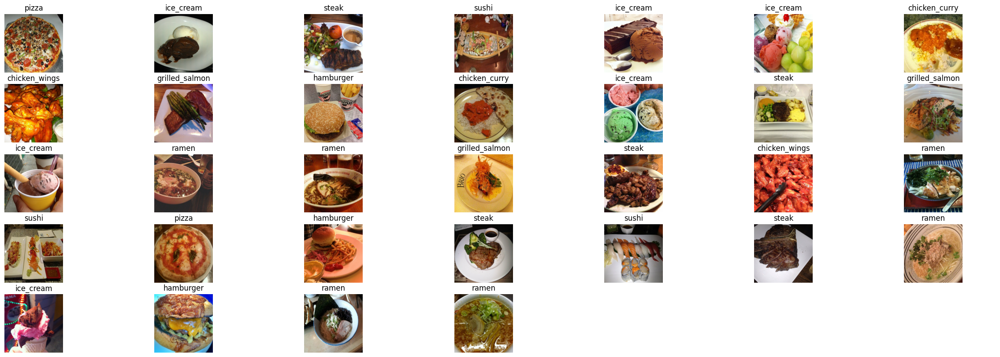

In [19]:
visulize_batch_from_dataset(test_data,classes_list)

# Train & Evaluate models

## Experiment - 1

In [20]:
!nvidia-smi

Mon Jun 19 11:26:37 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   71C    P0    31W /  70W |    421MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [21]:
base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2L(include_top=False)
base_model.trainable = False

473176280/473176280 [==============================] - 5s 0us/step


In [22]:
inputs = tf.keras.layers.Input(shape=(256,256,3))
print("Input tensor shape : ", inputs.shape)
x = base_model(inputs)
print("Shape after passing through base model : ", x.shape)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
print("Shape after passing through Global Average Poolinglayer : ", x.shape)
outputs = tf.keras.layers.Dense(10, activation="softmax")(x)
print("Output tensor shape : ", outputs.shape)

model_1 = tf.keras.Model(inputs, outputs)
model_1.summary()

Input tensor shape :  (None, 256, 256, 3)
Shape after passing through base model :  (None, 8, 8, 1280)
Shape after passing through Global Average Poolinglayer :  (None, 1280)
Output tensor shape :  (None, 10)
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 efficientnetv2-l (Functiona  (None, None, None, 1280)  117746848
 l)                                                              
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 10)                12810     
                                                  

In [23]:
model_1.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

In [24]:
hist_1 = model_1.fit(train_data,
                    batch_size=32,
                    epochs=5,
                    validation_data=valid_data,
                    shuffle=True,
                    steps_per_epoch=len(train_data),
                    validation_steps=len(valid_data),
                    )

Epoch 1/5
19/19 [==============================] - 68s 1s/step - loss: 1.9004 - accuracy: 0.4417 - val_loss: 1.4722 - val_accuracy: 0.6667
Epoch 2/5
19/19 [==============================] - 12s 625ms/step - loss: 1.2095 - accuracy: 0.7100 - val_loss: 1.0532 - val_accuracy: 0.7133
Epoch 3/5
19/19 [==============================] - 12s 617ms/step - loss: 0.9084 - accuracy: 0.7967 - val_loss: 0.8893 - val_accuracy: 0.7467
Epoch 4/5
19/19 [==============================] - 12s 621ms/step - loss: 0.7568 - accuracy: 0.8250 - val_loss: 0.7937 - val_accuracy: 0.7533
Epoch 5/5
19/19 [==============================] - 15s 796ms/step - loss: 0.6573 - accuracy: 0.8550 - val_loss: 0.7419 - val_accuracy: 0.7667


In [25]:
model_1.evaluate(test_data)

79/79 [==============================] - 38s 475ms/step - loss: 0.6318 - accuracy: 0.8276


[0.6318449974060059, 0.8276000022888184]

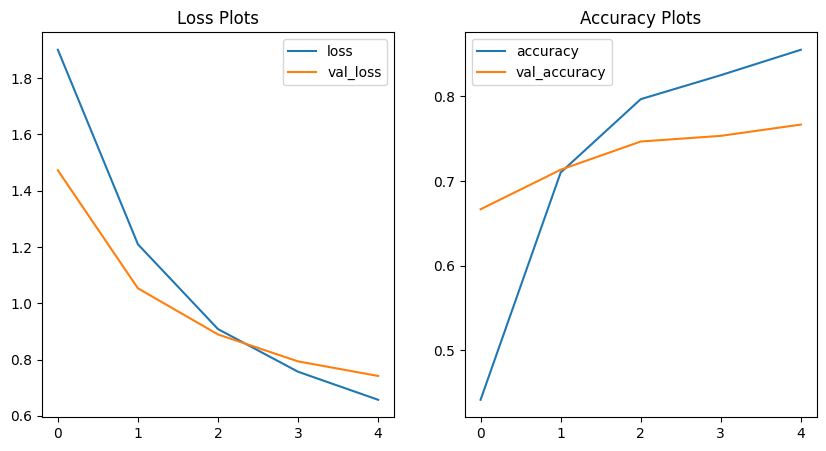

In [26]:
from helper_functions import plot_model_hist
plot_model_hist(hist_1)